# **_Introducción_**

Entre el ajetreo diario, los descuidos humanos, las inclemencias del clima y una población cercana a los 8 millones de habitantes, es muy común que se registren incidentes viales de todo tipo y magnitud dentro de una de las ciudades más grandes del mundo como lo es la CDMX.

El Centro de Comando, Control, Cómputo, Comunicaciones y Contacto Ciudadano de la CDMX (C5), es la dependencia del Gobierno de la Ciudad de México encargada de captar información integral para la toma de decisiones en materia de seguridad pública, urgencias médicas, medio ambiente, protección civil, movilidad y servicios a la comunidad en la capital del país a través del video monitoreo, de la captación de llamadas telefónicas y de aplicaciones informáticas de inteligencia, enfocadas a mejorar la calidad de vida de las y los capitalinos. Cada incidente registrado genera un folio único identificador, excepto las llamadas no procedentes o “falsas” (bromas, niños jugando, etc.) que se reciben por distintos medios.  Mientras un folio está abierto; es decir, mientras el registro está siendo atendido, éste no se carga en la base de datos interna, una vez que el folio ha sido cerrado éste se refleja en el sistema y es posible visibilizarlo internamente con un día de vencimiento, pues se realiza una recarga diaria (por esta razón las fechas de inicio y cierre de folio no necesariamente coinciden).

En el [Portal de datos de la Ciudad de México](https://datos.cdmx.gob.mx/pages/home/) podemos encontrar un conjunto de 1,368,503 registros con los [incidentes viales reportados por el C5](https://datos.cdmx.gob.mx/explore/dataset/incidentes-viales-c5/table/?disjunctive.incidente_c4) desde el 31 de diciembre de 2013 hasta el 3 de diciembre de 2020. Los registros se actualizan de forma mensual.

Este dateset consta de 18 columnas y el diccionario de datos correspondiente es el siguiente:

+ folio ---> Código único alfa numérico que se la asigna a cada uno de los incidentes que son generados (en C5 y los C2), está compuesto por dos iniciales del Centro que recibió la emergencia, fecha en formato AA/MM/DD y número consecutivo de ingreso, ejemplo: AO/181201/10801.
+ fecha_creacion ---> Fecha de apertura del folio del evento.
+ hora_creacion ---> Hora de apertura del folio del evento.
+ dia_semana ---> Día de apertura del folio.
+ codigo_cierre ---> Código que fue asignado al incidente en el cierre.
    + A = “Afirmativo”: Una unidad de atención a emergencias fue despachada, llegó al lugar de los hechos y confirmó la emergencia reportada.
    + N = “Negativo”: Una unidad de atención a emergencias fue despachada, llegó al lugar de los hechos, pero en el sitio del evento nadie confirmo la emergencia ni fue solicitado el apoyo de la unidad.
    + I = “Informativo”: Corresponde a solicitudes de información.
    + F = “Falso”: El incidente reportado inicialmente fue considerado como falso en el lugar de los hechos.
    + D = “Duplicados”: El incidente reportado se registró en dos o más ocasiones procediendo a mantener un solo reporte como el original. Para el uso e interpretación correctos de la información, debe considerarse:
    
    1) Para contabilizar aquellos incidentes “reales”, es decir, aquellos confirmados por las autoridades en el lugar de los hechos, se debe trabajar con los códigos de cierre “Afirmativo”.
    
    2) Para contabilizar los registros recibidos en la institución, se debe trabajar con todos los códigos de cierre.
+ fecha_cierre ---> Fecha de cierre del folio del evento.
+ año_cierre ---> Año de cierre del folio del evento.
+ mes_cierre ---> Mes de cierre del folio del evento.
+ hora_cierre ---> Hora de cierre del folio del evento.
+ delegacion_inicio ---> Alcaldía donde inicialmente se reportó el incidente.
+ incidente_c4 ---> Tipo de incidente.
+ latitud ---> Latitud en la que se registro el incidente.
+ longitud ---> Longitud en la que se registro el incidente.
+ clas_con_f_alarma ---> Clasificación del incidente.
+ tipo_entrada ---> Medio por el cual se dio aviso del incidente.
+ delegacion_cierre ---> Alcaldía donde cierra el folio del incidente.
+ geopoint --->  Punto sobre la superficie de la Tierra representado por las coordenadas de latitud y longitud en las que se registró el incidente.
+ mes ---> Mes (numérico) en el que se registró el incidente.

# **_Objetivo_**

En general, podemos clasificar los incidentes viales en dos grandes grupos: los incidentes en los cuales resulta alguna persona lesionada y los incidentes sin lesionados. La experiencia nos indica que, en los incidentes con lesionados, es necesaria la presencia de algún servicio médico (ambulancia) para corroborar la magnitud de la lesión y actuar conforme a los protocolos pertinentes. El objetivo de este proyecto será desarrollar un par de modelos de Machine Learning que nos permitan hacer una predicción sobre número de accidentes que van a requerir la presencia de una ambulancia en el lugar del incidente, es decir, predecir el número a futuro de incidentes en las que resulten personas heridas y/o fallecidas. 


# **_Librerías_**

In [1]:
# Análisis de datos y métodos númericos
import pandas as pd
import numpy as np

# Analisis Exploratorio 
from pandas_profiling import ProfileReport

# Graficación de datos
import matplotlib.pyplot as plt
import plotly.express as px

# Gráficar autocorrelaciones
from statsmodels.graphics.tsaplots import plot_acf

# **_Análisis Exploratorio Descriptivo_**

<img src='../Imágenes/Unknown-01.png'>

## _Generando la **variable objetivo**_

### Variable objetivo: **_requiere_ambulancia_**. 1 = Si requiere, 0 = No requiere.

Dividiremos los incidentes en dos grupos. El primero serán aquellos incidentes en los que SI se necesitará ambulancia (aquellos con lesionados confirmados o por confirmar) y el segundo grupo correspondera a los incidentes que NO requieran atención medica. A saber:

### Incidentes que requieren ambulancia
* accidente-choque con lesionado
* accidente-otros
* lesionado-accidente automovilístico
* lesionado-atropellado
* accidente-volcadura
* accidente-persona atrapada / desbarrancada
* cadáver-accidente automovilístico
* cadáver-atropellado
* accidente-motociclista
* accidente-choque con prensados
* accidente-vehiculo atrapado
* accidente-vehiculo desbarrancado
* accidente-ciclista
* accidente-monopatín
* sismo-choque con lesionados
* accidente-vehículo atrapado-varado
* accidente-ferroviario
* sismo-persona atropellada
* detención ciudadana-atropellado
* detención ciudadana-accidente automovilístico
* sismo-choque con prensados

### Incidentes que **NO** requieren ambulancia
* accidente-choque sin lesionado
* sismo-choque sin lesionados

<img src='../Imágenes/Unknown-02.png'>

In [2]:
df_verdaderos = pd.read_pickle("../Datos/df_verdaderos.pkl")

reporte_df_verdaderos = ProfileReport(df_verdaderos)
reporte_df_verdaderos

<img src='../Imágenes/Unknown-03.png'>

<img src='../Imágenes/Unknown-04.png'>

<img src='../Imágenes/Unknown-05.png'>

<img src='../Imágenes/Unknown-06.png'>

<img src='../Imágenes/Unknown-07.png'>

<img src='../Imágenes/Unknown-08.png'>

<img src='../Imágenes/Unknown-09.png'>

<img src='../Imágenes/Unknown-10.png'>

<img src='../Imágenes/Unknown-11.png'>

<img src='../Imágenes/Unknown-12.png'>

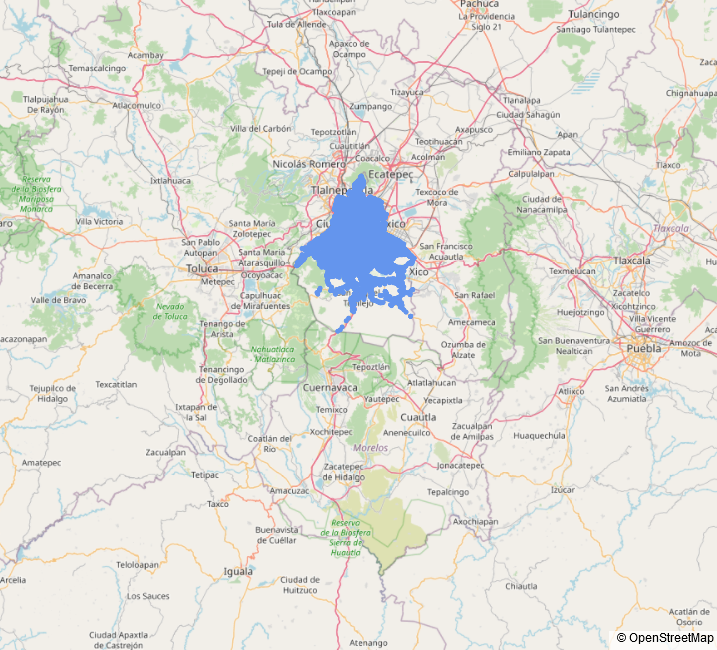

In [3]:
mapeo = df_verdaderos.sample(frac=0.05) # por cuestiones de RAM solo me quedo con el 5% de la info

fig = px.scatter_mapbox(mapeo, lat='latitud', lon='longitud', hover_name='incidente_c4', 
                        color_discrete_sequence=['cornflowerblue'], zoom=9, width=750, height=650)

fig.update_layout(mapbox_style='open-street-map')

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

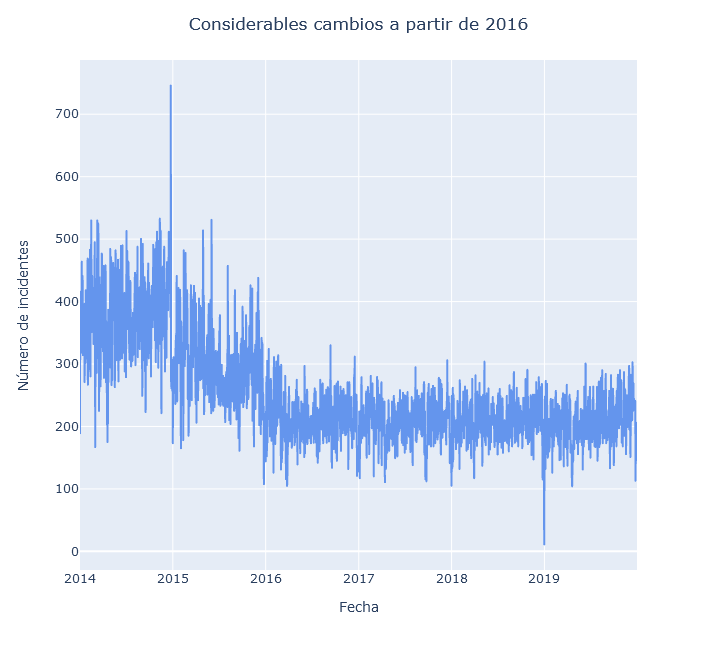

In [4]:
serie_verdaderos = pd.read_pickle('../Datos/serie_verdaderos.pkl')

x_serie_verdaderos = serie_verdaderos.cuando
y_serie_verdaderos = serie_verdaderos.cuantos

fig_serie_verdaderos = px.line(serie_verdaderos, x_serie_verdaderos, y_serie_verdaderos)

fig_serie_verdaderos.update_layout(title_text='Considerables cambios a partir de 2016', title_x=0.5,
                     yaxis_title='Número de incidentes', xaxis_title='Fecha', width=1200, height=650)

fig_serie_verdaderos.update_traces(line_color='cornflowerblue')

fig_serie_verdaderos.show()

## Fechas con mayor número de accidentes:

* 2014-02-14: Día de San Valentín.
* 2014-03-10: Sin registros.
* 2014-03-12: Sin registros.
* 2014-03-14: Partidos de vuelta de Octavos de final de la Champions.
* 2014-07-03: Sin registros.
* 2014-10-31: Halloween.
* 2014-11-11: Sin registros.
* 2014-11-14: Sin registros.
* 2014-12-16: Inicio de las posadas.
* 2014-12-24: Nochebuena.
* 2015-04-30: Sin registros.
* 2015-06-02: Sin registros.
* 2016-01-07: Sin registros.
* 2016-01-13: Caída de nieve en el Ajusco y La Marquesa.
* 2016-02-03: Sin registros.
* 2016-02-12: Sin registros.
* 2016-02-19: Sin registros.
* 2016-09-12: Sin registros.
* 2016-12-16: Inicio de las posadas
* 2017-12-15: Sin registros.
* 2018-05-10: Sismo al norte de Coyoacán.
* 2019-06-12: Marchas y protestas.
* 2019-12-13: Masrchas, protestas y plantones.

## Fechas con mayor número de accidentes:

* 2014-01-01: Año Nuevo.
* 2014-03-02: Día feriado por el día de la Constitución.
* 2014-04-19: Sin registros.
* 2015-01-01: Año Nuevo.
* 2015-02-02: Sin registros.
* 2015-02-11: Sin registros.
* 2015-03-04: Sin registros.
* 2015-09-16: Día feriado por el día de Independencia Mexicana.
* 2015-09-20: Sin registros.
* 2015-11-16: Día feriado por el día de la Revolución Mexicana
* 2015-12-13: Sin registros.
* 2015-12-25: Navidad.
* 2015-12-26: Sin registros.
* 2015-12-27: Sin Registros.
* 2015-12-29: Sin Registros.
* 2015-12-31: Fin de Año.
* 2016-03-25: Viernes Santo.
* 2018-01-01: Año Nuevo.
* 2018-12-31: Fin de Año.
* 2019-04-20: Marchas y movilizaciones.

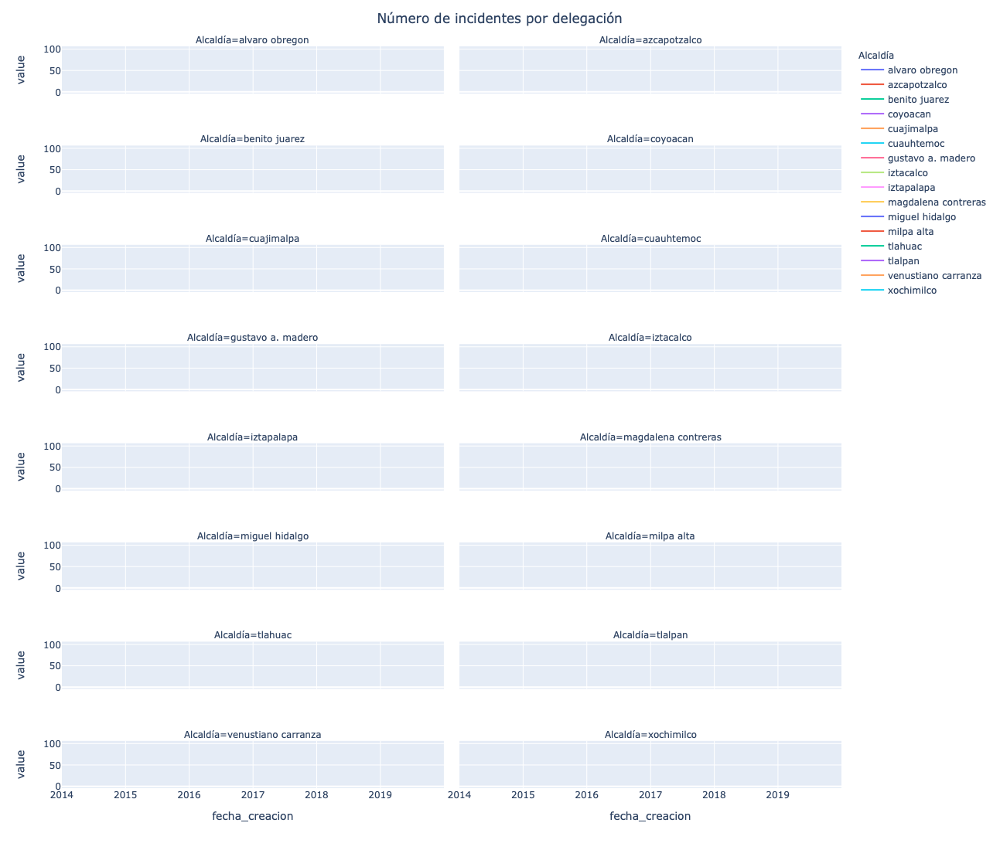

In [5]:
serie_dia = pd.DataFrame(df_verdaderos.groupby(['delegacion_inicio','fecha_creacion']).size().unstack(0))

fig_serie_dia = px.line(serie_dia, facet_col="delegacion_inicio", facet_col_wrap=2,
                        labels={"delegacion_inicio": "Alcaldía"})

fig_serie_dia.update_layout(title_text='Número de incidentes por delegación', title_x=0.5, width=1300, height=1100)

fig_serie_dia.show()

## Correlaciones

### Phi_k

A diferncia de otros métodos, **_Phi_K_** nos permite calcular correlaciones entre variables de diferentes tipos. 

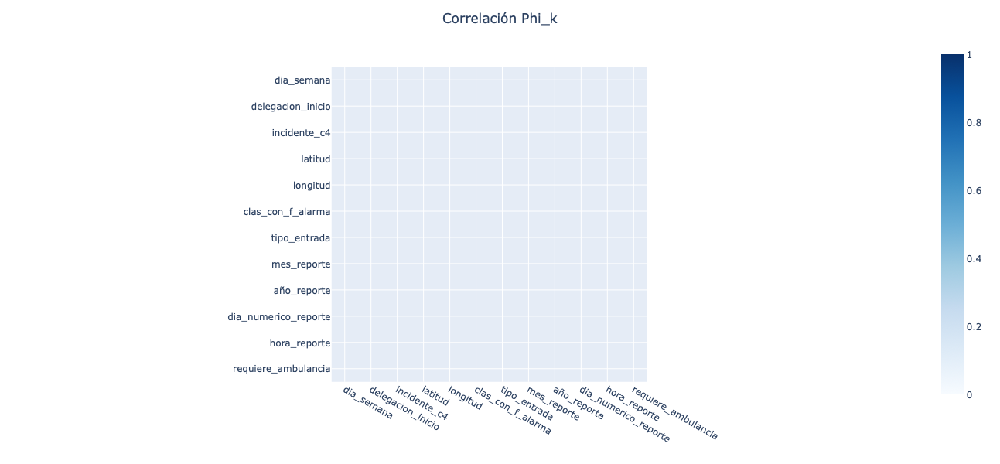

In [6]:
phik = pd.read_pickle('../Datos/phik.pkl')

fig_phik = px.imshow(phik,color_continuous_scale = px.colors.sequential.Blues)
fig_phik.update_layout(title_text='Correlación Phi_k', title_x=0.5, width=600, height=600)
fig_phik.show()

### Cramér

La V de Cramér es una medida que permite asociar dos variables nominales, dando un valor entre 0 y 1.

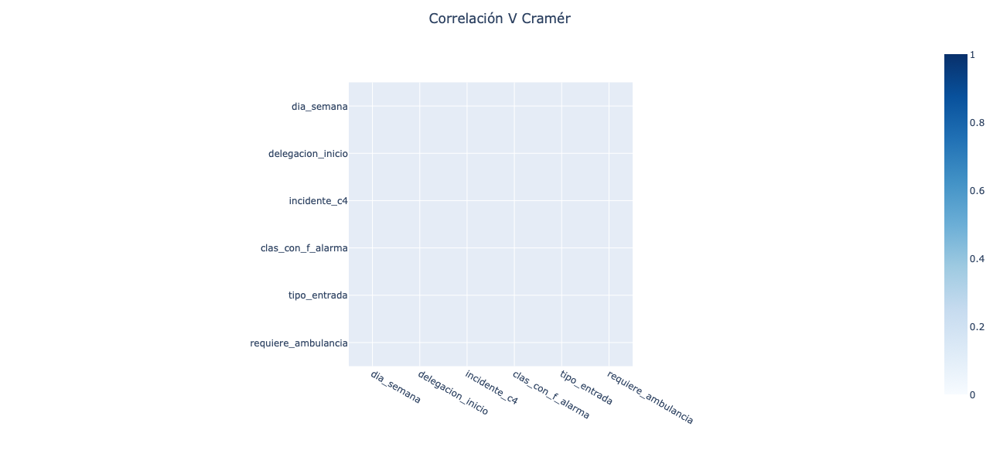

In [7]:
cramer = pd.read_pickle('../Datos/cramer.pkl')

fig_cramer = px.imshow(cramer,color_continuous_scale = px.colors.sequential.Blues)
fig_cramer.update_layout(title_text='Correlación V Cramér', title_x=0.5, width=600, height=600)
fig_cramer.show()

### Función de Autocorrelación _(ACF)_

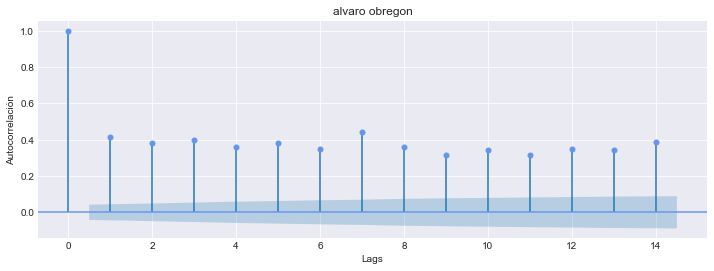

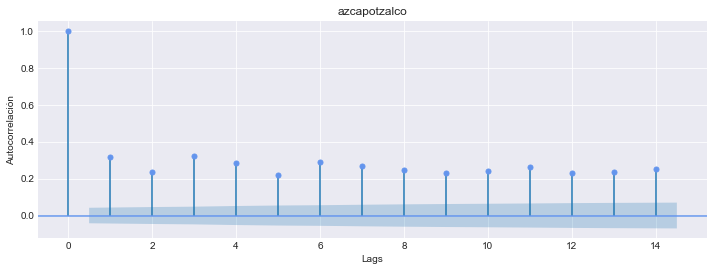

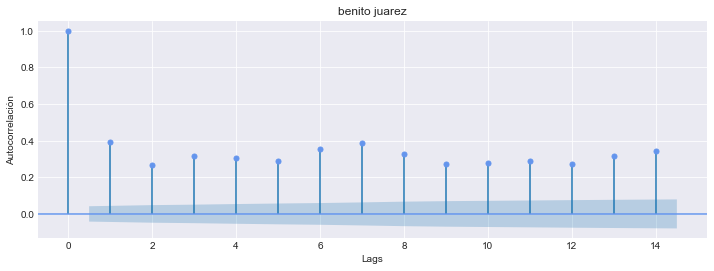

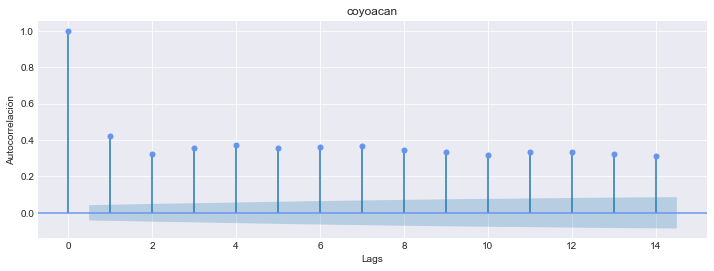

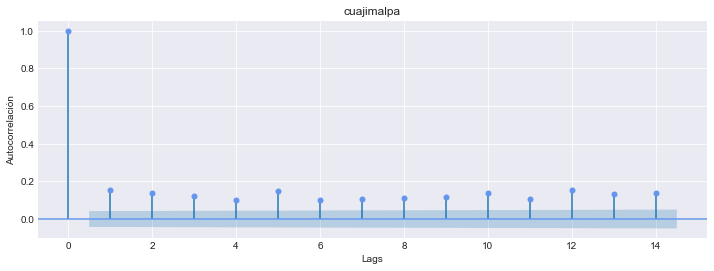

...

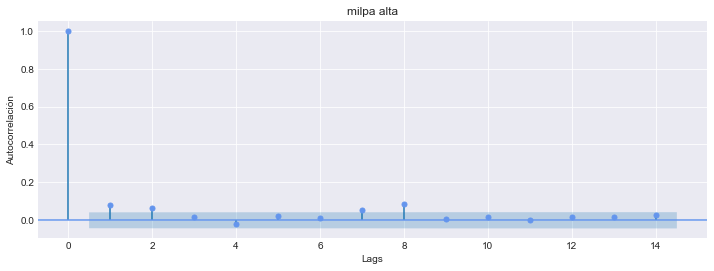

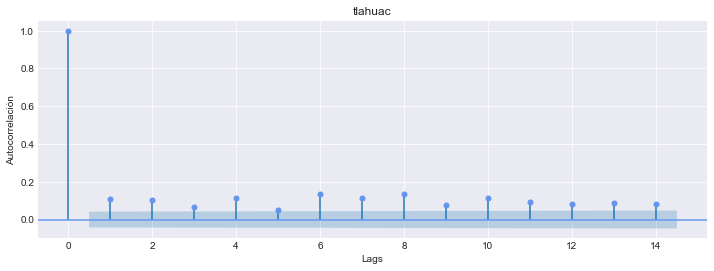

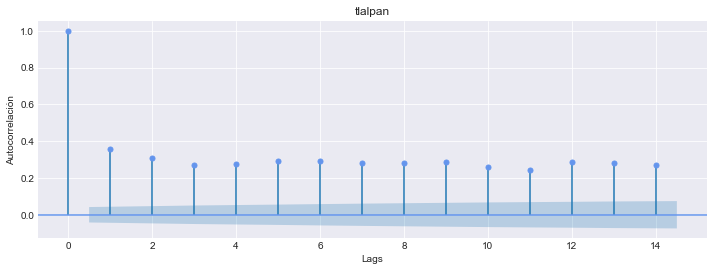

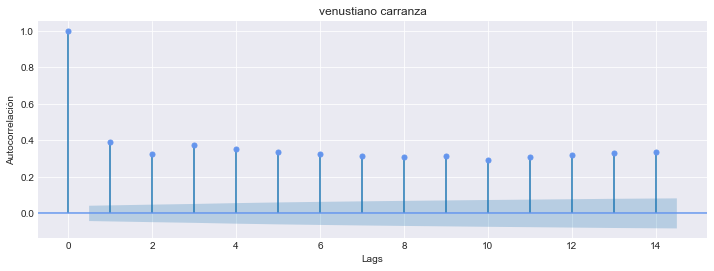

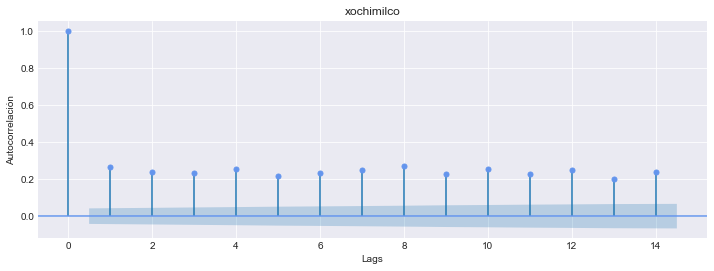

In [8]:
serie_acf = pd.DataFrame(df_verdaderos.groupby(['delegacion_inicio','fecha_creacion']).size().unstack(0)).reset_index().set_index('fecha_creacion')
serie_acf.fillna(0, inplace=True) 

plt.style.use('seaborn-darkgrid')

N, M = 12, 4
delegacion = pd.DataFrame(serie_acf)

for idx,columna in enumerate(delegacion):

    fig, ax = plt.subplots(figsize=(N, M))
    plot_acf(serie_acf[columna], lags = 14, title=columna, ax=ax, color='cornflowerblue')
    plt.xlabel("Lags")
    plt.ylabel("Autocorrelación")
    plt.show()

En general, podemos ver autocorrelaciones en todas las alcaldías, cada una en diferente número de lags (diferentes periodos de tiempo).

Las alcaldías Cuajimalpa, Magdalena Contreras, Milpa Alta y Tlahuac tienen valores de autocorrelación que pueden ser considerados como _cero_, lo que significa que, en estas alcaldías, es más difícil que se presente algún periodo estacionario. Como en toda serie de tiempo, seguramente tendrán al menos uno, pero en las series de tiempo, entre menos sea el valor de la autocorrelación, menor será la probabilidad de presentar periodos estacionarios.

Se logra visualizar que la periodicidad en nuestra variable, en general, puede variar entre cada 3 y cada 6 lags aproximadamente dependiendo de la alcaldía.

Recordemos que un _periodo estacionario_ es aquel estado en el cual, el comportamiento de una variable no presenta variaciones respecto del tiempo.

# **_Machine Learning_**

Luego de nuestra limpieza de datos y el AED, nuestra tabla resultante para hacer nuestros modelos de Machine Learning es la siguiente:

In [9]:
tabla_modelo1 = pd.read_pickle("../Datos/tabla_modelo1.pkl")

tabla_modelo1

,fecha_creacion,delegacion_inicio,mes_reporte,año_reporte,dia_numerico_reporte,hora_reporte,requiere_ambulancia,fin_de_semana,azcapotzalco,benito juarez,...,magdalena contreras,miguel hidalgo,milpa alta,tlahuac,tlalpan,venustiano carranza,xochimilco,no_shift,shift_1,shift_2
0,2014-01-01,benito juarez,1,2014,1,7,0,0,0,1,...,0,0,0,0,0,0,0,9,8.0,12.0
1,2014-01-01,benito juarez,1,2014,1,11,1,0,0,1,...,0,0,0,0,0,0,0,9,8.0,12.0
2,2014-01-01,benito juarez,1,2014,1,15,0,0,0,1,...,0,0,0,0,0,0,0,9,8.0,12.0
3,2014-01-01,benito juarez,1,2014,1,2,1,0,0,1,...,0,0,0,0,0,0,0,9,8.0,12.0
5,2014-01-01,benito juarez,1,2014,1,10,1,0,0,1,...,0,0,0,0,0,0,0,9,8.0,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
553094,2019-12-31,xochimilco,12,2019,31,10,1,0,0,0,...,0,0,0,0,0,0,1,13,19.0,18.0
553095,2019-12-31,xochimilco,12,2019,31,19,1,0,0,0,...,0,0,0,0,0,0,1,13,19.0,18.0
553096,2019-12-31,xochimilco,12,2019,31,21,1,0,0,0,...,0,0,0,0,0,0,1,13,19.0,18.0
553098,2019-12-31,xochimilco,12,2019,31,10,0,0,0,0,...,0,0,0,0,0,0,1,13,19.0,18.0


Partiremos nuestros datos en dos grupos. Los incidentes reportados entre 2016 y 2018 serán el conjunto con el cual haremos el entrenamiento. 2019 será nuestro cojunto de prueba.

Para la predicción, filtraremos los datos de los incidentes que si requirieron ambulancia y a partir de ellos, se hará la predicción del número.

<img src='../Imágenes/Unknown-13.png'>

## Modelos Particulares

Como ya vimos, a partir de 2016 hay una disminución considerable del número de incidentes reportados. La serie de tiempo de estos datos nos permite ver el cambio en la varianza asociado a esta disminución de incidentes, lo cual se traduce en que estamos frente a una serie de tiempo **_no estacionaría_**.

A diferencia de las **_series estacionarias_**, en una **_serie no estacionaría_** es un poco más complejo realizar las predicciones ya que, como la media **_no es constante_**, estimarla para todos los datos y utilizarla para predecir una nueva observación no resulta tan directo.

Como sabemos la posible causa de esta disminución de incidentes (las fotomultas), tenemos dos opciones, la primera es realizar nuestros modelos tomando únicamente los datos a partir de 2016 donde es clara la estacionalidad o bien, hacer un tratamiento de datos para suavizar un poco la tendencia estacional.

Nosotros en este primer modelo hicimos la primera de las dos opciones, es decir, realizar un modelo con los datos que presentan estacionalidad.

Los 4 modelos particulares que se hicieron a nivel _alcaldía_ fueron los de las alcaldías Iztapalapa (autocorrelación alta), Cuauhtémoc (autocorrelación media-alta), Xochimilco (autocorrelación media-baja) y Milpa Alta (autocorrelación baja).

Las únicas variables con las que contamos para estos modelos son los shifts sobre el número de incidentes que creamos durante el tratamiento de datos y el día numérico en el que los incidentes fueron reportados. Al tratarse de modelos a nivel _"día"_, no tendría sentido incluir los datos sobre el mes y al año de los registros.

<img src='../Imágenes/Unknown-32.png'>

<img src='../Imágenes/Unknown-14.png'>

Cuando se hacen modelos de predicción, la medida $ R^2 $ nos ayuda a determinar la calidad del modelo al momento de hacer la predicción de valores en cuestión. Esta medida toma valores que van de 0 a 1 donde entre mayor sea este valor, mejor es el ajuste del modelo a los datos. Una vez sabiendo lo anterior, al aplicar un modelo predictor de regresión lineal sobre una alcaldía como Iztapalapa donde el número de incidentes registrados presentan una alta autocorrelación, con las 3 variables ya enunciadas sobre el modelo, tenemos un valor de $ R^2 $ de apenas el 3.3%. Únicamente con esto ya podemos decir que estamos frente a un modelo que aún se queda demasiado corto para nuestros objetivos.

La $ R^2 $ ajustada se utiliza en las regresiones múltiples para determinar el grado de efectividad con el que las variables independientes pueden determinar a la variable a predecir. En este caso también tenemos un porcentaje demasiado bajo, por lo cual, únicamente utilizando los datos sobre esta alcaldía específica, la cual, recordemos es la que presenta el mayor número de incidentes, no es suficiente para hacer un modelo general a nivel CDMX, sin embargo, nos sirve para comenzar a visualizar el comportamiento e influencia de las variables.

El RMSE se encarga de estimar el promedio de los errores que tiene el modelo en sus predicciones, es decir, la diferencia entre el valor real y el valor predicho. Para el caso de Iztapalapa, tenemos un RMSE de 8.09, lo cual nos dice que estamos fallando en cerca del 10% de nuestras predicciones por día.

El Error Absoluto Medio (MAE) es muy parecido al RMSE, pues determina la precisión en la predicción de los modelos, comparando los valores predichos frente a los observados. El MAE es la suma de los errores de cada predicción con respecto al valor real partido por el número de muestras por lo cual un 6.3% no resulta ser un error de gravedad.

Si queremos determinar el índice general de error de la predicción en términos porcentuales, tenemos el MAPE. Para este caso un MAPE del 20.32% nos indica que nuestro modelo tiene alrededor del 80% de exactitud. 

Finalmente, para una regresión lineal, el residuo se refiere a las diferencias que hay entre los valores observados y los valores que predecimos. En otras palabras, si graficamos los valores predichos y los comparamos con respecto a la recta de la regresión, el residuo es la distancia que tienen los valores predichos respecto a la recta de la regresión. Entre menor sea el residuo promedio mejor es la predicción. Para nuestro modelo, tenemos un residuo promedio aceptable que igual que el MAPE, es del 20.3% aprox.

<img src='../Imágenes/Unknown-17.png'>

El modelo tiene una distribución uniforme tanto por encima como por debajo de los valores reales (línea punteada). Nuestra predicción no esta sesgada.

<img src='../Imágenes/Unknown-18.png'>

Sin embargo, los datos presentan una asimétria hacia la derecha. La mayoría de los días hay relativamente pocos (valor medio) incidentes y solo algunos días, el número de los incidentes aumenta considerablemente.

<img src='../Imágenes/Unknown-20.png'>

Con este gráfico se puede observar mejor la distribución de los residuos que tienen nuestras predicciones. Hay una gran concentración en residuos por debajo del 20% del valor real.

<img src='../Imágenes/Unknown-21.png'>

La predicción tiene un problema de dispersión irregular ya que al graficar los errores respecto a los deciles podeos observar un aumento en la varianza de los residuos (errores) conforme aumenta el decil. En otras palabras, los errores de predicción aumentan conforme aumenta el número de datos analizados/predichos.

<img src='../Imágenes/Unknown-15.png'>

Para el modelo de la alcaldía Cuauhtémoc hay un comportamiento bastante similar tanto en los coeficientes obtenidos como en el comportamiento gráfico.

<img src='../Imágenes/Unknown-22.png'>

<img src='../Imágenes/Unknown-23.png'>

El sesgo se mantiene pero ya de forma un tanto más uniforme (tiene una forma ligeramente más normalizada que el caso de la alcaldía Iztapalapa).

<img src='../Imágenes/Unknown-24.png'>

Y aunque gráficamente vemos un aumento en los residuos para incidentes menores o iguales a 27, para los días en que hay 28 o más incidentes, el residuo disminuye, incluso para más de 30 incidentes el residuo disminuye de tal forma que podríamos interpretar que para esos casos particulares, la predicción es bastante buena. A pesar de ello, en general el residuo promedio de este modelo no difiere mucho del anterior.

<img src='../Imágenes/Unknown-25.png'>

<img src='../Imágenes/Unknown-16.png'>

Para las alcaldías Xochimilco y Milpa Alta donde la autocorrelación es prácticamente nula, el valor de $ R^2 $ adquiere valores negativos, lo cual es un indicador de que el modelo está teniendo un aprendizaje bastante ineficiente, pues está arrojando coeficientes fuera de rango, es decir, esta mal.

## Modelo General

### Regresión multilineal

Para este modelo general se hizo un tratamiento dummie sobre las alcaldías y nuevamente son consideraron los shifts y los días (númericos) de los incidentes.

<img src='../Imágenes/Unknown-33.png'>

<img src='../Imágenes/Unknown-19.png'>

Tan solo viendo los coeficientes de este modelo que ya contempla todas las alcaldías de las CDMX, vemos una notable mejoría en la predicción de los incidentes. A grandes rasgos, la calidad de la predicción ($ R^2 $) aumento sin tener impacto considerable sobre los porcentajes en el error de predicción.

Este modelo tiene un $ R^2 $ del 65% que, aunque aún no es un valor óptimo, para ser una primera aproximación, es un modelo con una predicción aceptable. Por su parte nuestros errores RMSE y MAE indican que nuestra predicción solo difiere en cerca del 5% del valor real. Sin embargo, a nivel general, solo tenemos aproximadamente un 70% de efectividad en la predicción. El residuo aumento considerablemente respecto a los modelos particulares (se duplico), sin embargo, estamos frente a un modelo que nos compra un par de días más.

<img src='../Imágenes/Unknown-26.png'>

Este modelo aunque presenta un comportamiento adecuado en los casos con incidentes menores a 30. A partir de ese número, la predicción sufre un aplanamiento que se traduce como un comportamiento no eficiente.

<img src='../Imágenes/Unknown-27.png'>

Sin embargo, su histograma presenta una línea de distribución ajustada, descrita por una función normal, lo cual nos indica que el ajuste de los datos es correcto.

<img src='../Imágenes/Unknown-28.png'>

Aunque aún se observa un ligero comportamiento de dispersión, ya no es tan marcado como lo era con los modelos particulares por alcaldía. Este modelo general si presenta un aumento de error conforme aumenta la cantidad de datos pero en general, el error es bastante uniforme a lo largo de los primeros 8 deciles (aumenta apenas en un 15%.)

<img src='../Imágenes/Unknown-29.png'>

Los residuos, como ya se mencionó, fueron los coeficientes más perjudicados en este modelo, sin embargo, al observar su comportamiento de forma gráfica, podemos darnos cuenta que, pese al aumento en su medida, su distribución es bástate regular, dándonos a entender que el aumento fue uniforme, es decir, es una "suma" de errores generales. No se le atribuye a una variable en específico.

## Shap Values

<img src='../Imágenes/Unknown-30.png'>

Al hacer un shap values podemos ver que curiosamente, la variable que más influye sobre el número de incidentes que requerirán de una ambulancia, es el comportamiento de la alcaldía Iztapalapa, lo cual, si lo analizamos detenidamente, hace sentido, pues al ser la alcaldía con más incidentes registrados, es más probable que se requiera de ambulancias dentro de esta alcaldía que en alguna como Milpa Alta donde ya vimos que el número de incidentes es demasiado bajo.

<img src='../Imágenes/Unknown-31.png'>

A nivel global, claramente los shifts que hicimos sobre el número de incidentes, así como lo que ocurra en las alcaldías Iztapalapa, Cuauhtémoc y GAM son las variables que tienen mayor impacto positivo sobre el modelo. Contrariamente y como era de esperarse, las alcaldías con menor número de incidentes como lo son Magdalena Contreras y Milpa Alta tienen muy poco impacto. Otra cosa que podemos ver es que no tenemos outliers (colores mezclados), por lo cual, resumiendo todo, podemos decir que es un modelo con un comportamiento bastante estable que, de ser pulido y nutrido con más variables, posiblemente obtenga predicciones más certeras.

## KNN Regression

<img src='../Imágenes/Unknown-34.png'>

Si intentamos determinar el número de incidentes, pero ahora mediante un método de clasificación como lo es el K-Nearest Neighbors y buscamos el valor óptimo de k con el cual tengamos la precisión (accuracy) más alta dentro de un intervalo de 1 a 10, encontramos que ese valor es k = 9, sin embargo, es un modelo muy pobre pues cuenta con apenas 20% de precisión y un error absoluto en las predicciones del 56%. Un pésimo modelo.

<img src='../Imágenes/Unknown-35.png'>

<img src='../Imágenes/Unknown-36.png'>

<img src='../Imágenes/Unknown-37.png'>

<img src='../Imágenes/Unknown-38.png'>

Analizando los residuos, podemos visualizar un cierto patron ondulatorio en el comportamiento de los residuos. Este tipo de patrones ocurre en las regresiones lineales cuando los modelos son adecuados pues nos indican que todos los residuos tienden a caer sobre la banda horizontal centrada en torno al cero.

## Futuras mejoras

El modelo general que hicimos presenta un comportamiento y ajuste regular en los datos. Los coeficientes de evaluación obtenidos no son los ideales, pero tampoco son malos. Como planes a futuro sobre este código, se planea enriquecer el modelo con más variables que puedan favorecer la predicción. Particularmente, se planea dar continuidad al análisis de las fechas y temporadas en las que aumentan los incidentes, además del scraping sobre algún sitio web como lo es [timeanddate](https://www.timeanddate.com/weather/mexico/mexico-city/historic) para obtener el historial climático de la CDMX y hacer el cruce de datos pertinente.

Otra mejora que se planea hacer un tratamiento sobre los datos para suavizar un poco la tendencia de la varianza que se presenta a partir de 2016, es decir, generalizar el modelo para que este sea capaz de predecir los incidentes de la forma más precisa posible aún y cuando se tenga una serie de tiempo no estacionaria, pues recordemos que, para este primer modelo, únicamente nos enfocamos en el intervalo de tiempo donde la serie presentaba estacionalidad.